# CS 334 HW3
## Simon Marty


In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import selFeat
import seaborn as sns
from matplotlib import pyplot as plt
from sgdLR import SgdLR
from standardLR import StandardLR

In [4]:
xTrain = pd.read_csv('eng_xTrain.csv')
xTest = pd.read_csv('eng_xTest.csv')
yTrain = pd.read_csv('eng_yTrain.csv')
yTest = pd.read_csv('eng_yTest.csv')

In [5]:
xTrain = selFeat.extract_features(xTrain)
xTest = selFeat.extract_features(xTest)
xTrain

,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,month,hour,day
0,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,17.166667,...,45.53,6.60,733.50,92.0,7.000000,63.000000,5.30,1,17,11
1,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,17.166667,...,45.56,6.48,733.60,92.0,6.666667,59.166667,5.20,1,17,11
2,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,17.166667,...,45.50,6.37,733.70,92.0,6.333333,55.333333,5.10,1,17,11
3,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,17.166667,...,45.40,6.25,733.80,92.0,6.000000,51.500000,5.00,1,17,11
4,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,17.200000,...,45.40,6.13,733.90,92.0,5.666667,47.666667,4.90,1,17,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16765,0,23.890000,37.900000,21.890000,39.090000,24.390000,37.730000,23.700000,36.700000,21.100000,...,43.23,14.20,752.35,55.0,2.666667,40.000000,5.18,5,3,7
16766,0,23.823333,37.826667,21.823333,39.030000,24.463333,37.863333,23.600000,36.590000,21.100000,...,43.29,13.80,752.30,57.0,2.333333,40.000000,5.27,5,3,7
16767,0,23.823333,37.790000,21.840000,39.145000,24.500000,37.950000,23.633333,36.700000,21.100000,...,43.29,13.40,752.25,59.0,2.000000,40.000000,5.35,5,3,7
16768,0,23.823333,37.790000,21.760000,39.090000,24.500000,38.000000,23.633333,36.626667,21.100000,...,43.29,12.90,752.20,61.0,1.666667,40.000000,5.43,5,3,7


In [6]:
xTrain['label'] = pd.read_csv('eng_yTrain.csv')
xTrain

,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,month,hour,day,label
0,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,17.166667,...,6.60,733.50,92.0,7.000000,63.000000,5.30,1,17,11,4.094345
1,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,17.166667,...,6.48,733.60,92.0,6.666667,59.166667,5.20,1,17,11,4.094345
2,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,17.166667,...,6.37,733.70,92.0,6.333333,55.333333,5.10,1,17,11,3.912023
3,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,17.166667,...,6.25,733.80,92.0,6.000000,51.500000,5.00,1,17,11,3.912023
4,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,17.200000,...,6.13,733.90,92.0,5.666667,47.666667,4.90,1,17,11,4.094345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16765,0,23.890000,37.900000,21.890000,39.090000,24.390000,37.730000,23.700000,36.700000,21.100000,...,14.20,752.35,55.0,2.666667,40.000000,5.18,5,3,7,4.248495
16766,0,23.823333,37.826667,21.823333,39.030000,24.463333,37.863333,23.600000,36.590000,21.100000,...,13.80,752.30,57.0,2.333333,40.000000,5.27,5,3,7,3.912023
16767,0,23.823333,37.790000,21.840000,39.145000,24.500000,37.950000,23.633333,36.700000,21.100000,...,13.40,752.25,59.0,2.000000,40.000000,5.35,5,3,7,4.094345
16768,0,23.823333,37.790000,21.760000,39.090000,24.500000,38.000000,23.633333,36.626667,21.100000,...,12.90,752.20,61.0,1.666667,40.000000,5.43,5,3,7,3.912023


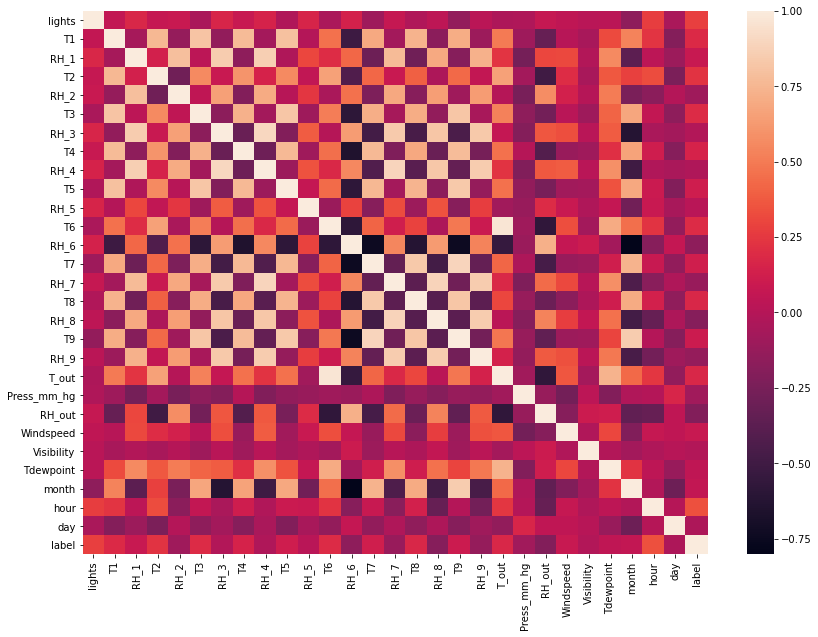

In [7]:
fig = plt.figure(figsize=(14,10))
ax = sns.heatmap(xTrain.corr())
plt.savefig('corr_heapmap')


According to this heatmap, some good features (features that have a high degree of correlation with the label)
are `lights`, and Temperature probes `T`. All `T`s appear to be heavily inter-
correlated so I believe using only one probe will suffice. Similarly, humidity
sensors are heavily negatively correlated with the `label`, but are all very inter-correlated, therefore
I only keep one.

In [8]:
xTrain = selFeat.select_features(xTrain)
xTest = selFeat.select_features(xTest)
xTrain

,lights,T2,RH_2,hour
0,30,19.200000,44.790000,17
1,30,19.200000,44.722500,17
2,30,19.200000,44.626667,17
3,40,19.200000,44.590000,17
4,40,19.200000,44.530000,17
...,...,...,...,...
16765,0,21.890000,39.090000,3
16766,0,21.823333,39.030000,3
16767,0,21.840000,39.145000,3
16768,0,21.760000,39.090000,3


In [9]:
xTrain, xTest = selFeat.preprocess_data(xTrain, xTest)
xTrain.to_csv('new_xTrain.csv', index=False)
xTest.to_csv('new_xTest.csv', index=False)
xTrain

,lights,T2,RH_2,hour
0,3.153974,-0.338866,1.230377,0.792322
1,3.153974,-0.338866,1.212130,0.792322
2,3.153974,-0.338866,1.186223,0.792322
3,4.372856,-0.338866,1.176311,0.792322
4,4.372856,-0.338866,1.160091,0.792322
...,...,...,...,...
16765,-0.502671,1.267021,-0.310498,-1.227060
16766,-0.502671,1.227222,-0.326718,-1.227060
16767,-0.502671,1.237172,-0.295630,-1.227060
16768,-0.502671,1.189413,-0.310498,-1.227060


# Question 3

## (b)

*For a batch size of 1 (i.e.,bs= 1) and a random subset of 40% of the
training data, try various learning rates (such as 1, 0.1, 0.01, 0.001, 0.0001, 0.00001)
and plot the mean squared error on the training data as a function of the epoch
(i.e., one epoch = one pass through the training data).*

*What seems to be an optimal learning rate?  Justify your answer based on the plot.*

In [10]:
x, xtest, y, ytest = train_test_split(xTrain, yTrain, train_size=0.4)
x = x.to_numpy()
xtest = xtest.to_numpy()
y = y.to_numpy().ravel()
ytest = ytest.to_numpy().ravel()

In [11]:
output = pd.DataFrame(columns = ['batch', 'train-mse', 'test-mse', 'alpha'])
for alpha in [0.1, 0.01, 0.001, 0.0001, 0.00001]:
    sgd = SgdLR(alpha, 1, 1)
    for k, v in sgd.train_predict(x, y, xtest, ytest).items():
        d = {
            "batch": k,
            "train-mse": v['train-mse'],
            "test-mse": v['test-mse'],
            "alpha": alpha,
        }
        output = output.append(d, ignore_index=True)
output['alpha'] = output.alpha.astype('category')
output

,batch,train-mse,test-mse,alpha
0,0.0,12.440750,12.477959,0.10000
1,1.0,10.405427,10.329816,0.10000
2,2.0,8.345059,8.144627,0.10000
3,3.0,5.071386,4.945557,0.10000
4,4.0,4.553502,4.437243,0.10000
...,...,...,...,...
33535,6703.0,14.393307,14.452041,0.00001
33536,6704.0,14.393166,14.451906,0.00001
33537,6705.0,14.393141,14.451884,0.00001
33538,6706.0,14.392915,14.451653,0.00001


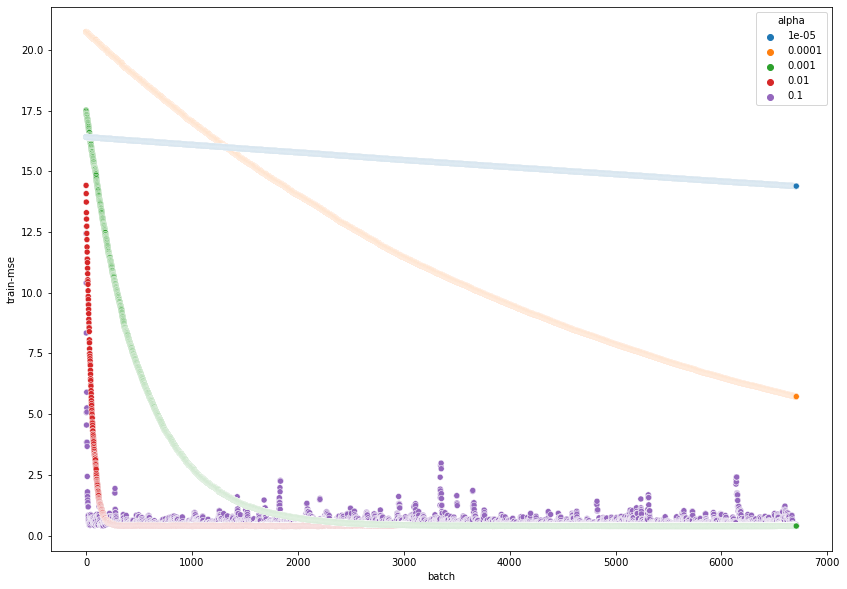

In [12]:
fig = plt.figure(figsize=(14,10))
sns.scatterplot(data=output, x="batch", y="train-mse", hue="alpha")
plt.show()


The optimal learning rate appears to be `0.001` (although `0.01` is probably also a fine choice), learning rates below it take too long to decrease their mse, or do not reach optimal `mse` in time. Learning rates larger fail to converge and look erratic.

## (c)

*Using the optimal learning rate from (b), train the model on the entire dataset and plot the mean squared error on the training data and the test data as a function of the epoch.*

I am using `alpha = 0.001`

In [13]:
output2 = pd.DataFrame(columns = ['batch', 'train-mse', 'test-mse', 'alpha'])
x = xTrain.to_numpy()
xtest = xTest.to_numpy()
y = yTrain.to_numpy().ravel()
ytest = yTest.to_numpy().ravel()

sgd = SgdLR(0.001, 1, 1)
for k, v in sgd.train_predict(x, y, xtest, ytest).items():
    d = {
            "batch": k,
            "train-mse": v['train-mse'],
            "test-mse": v['test-mse'],
            "alpha": alpha,
        }
    output2 = output2.append(d, ignore_index=True)
output2['alpha'] = output2.alpha.astype('category')

In [14]:
output2

,batch,train-mse,test-mse,alpha
0,0.0,14.130182,14.616735,0.00001
1,1.0,14.122953,14.609836,0.00001
2,2.0,14.116673,14.603843,0.00001
3,3.0,14.113999,14.601464,0.00001
4,4.0,14.110831,14.598650,0.00001
...,...,...,...,...
16765,16765.0,0.388748,0.276674,0.00001
16766,16766.0,0.388711,0.276774,0.00001
16767,16767.0,0.388696,0.276814,0.00001
16768,16768.0,0.388659,0.276910,0.00001


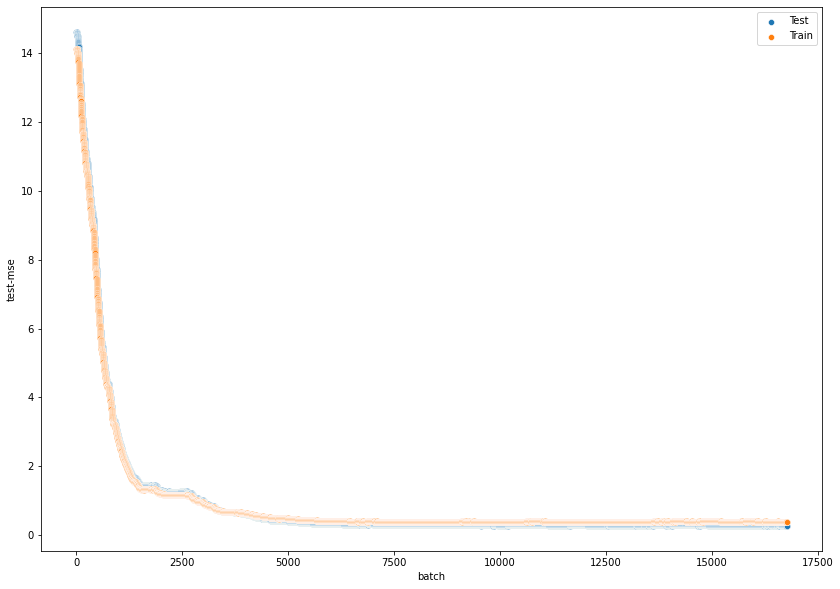

In [15]:
fig = plt.figure(figsize=(14,10))
sns.scatterplot(data=output2, x="batch", y="test-mse", label="Test")
sns.scatterplot(data=output2, x="batch", y="train-mse", label="Train")
plt.legend()
plt.show()

# Question 4

### (a)
*Explore the impact of batch sizes on the computation time and convergence of the SGD algorithm.
Choose a variety of batch sizes (it should include 1, and n, and a few more,where the training size is divisible by the number).*

*For each batch size, find a reasonable learning rate and then run SGD using that batch size.*

*Plot the mean squared error of the training data and the test data as a function of the total time for different batchsizes.
To make it easier, you may want to split training and test into two different plots.The plots should also include the point reflecting the closed form solution.*


In [16]:
output3 = pd.DataFrame(columns =
                       ['batch', 'batch_size',
                        'train-mse', 'test-mse',
                        'time','alpha',])

for batch_size in [1, 32, 74, 1677, 5590, 8385, 16770]:
    sgd = SgdLR(0.001, batch_size, 1)
    for k, v in sgd.train_predict(x, y, xtest, ytest).items():
        d = {
                "batch": k,
                "batch_size": batch_size,
                "train-mse": v['train-mse'],
                "test-mse": v['test-mse'],
                "time": v['time'],
                "alpha": alpha,
            }
        output3 = output3.append(d, ignore_index=True)
output3['alpha'] = output3.alpha.astype('category')

In [23]:
closed_form = StandardLR()

x = pd.read_csv('new_xTrain.csv')
xtest = pd.read_csv('new_xTest.csv')
y = pd.read_csv('eng_yTrain.csv')
ytest = pd.read_csv('eng_yTest.csv')
d = closed_form.train_predict(x, y, xtest, ytest)
d = d[0]

In [25]:
d['batch_size'] = "closed_form"
output3 = output3.append(d, ignore_index=True)

In [26]:
output3['batch_size'] = output3.batch_size.astype('category')
output3['timelog'] = output3['time'].apply(np.log10)

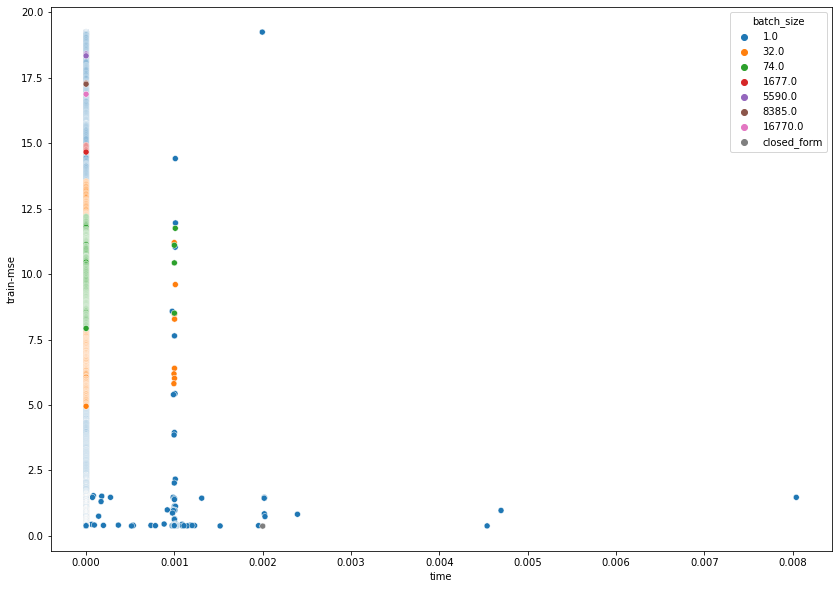

In [27]:
fig = plt.figure(figsize=(14,10))
sns.scatterplot(data=output3, x="time", y="train-mse", hue='batch_size')
plt.show()

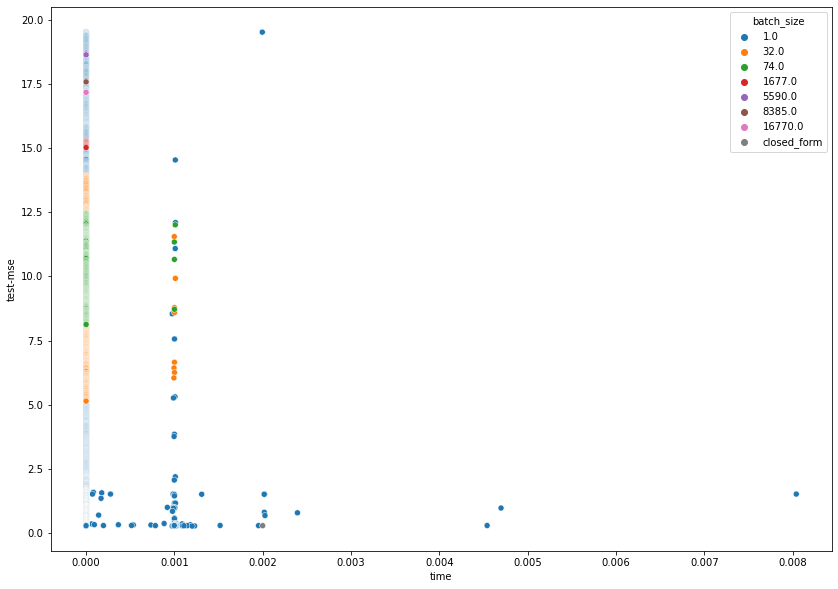

In [28]:
fig = plt.figure(figsize=(14,10))
sns.scatterplot(data=output3, x="time", y="test-mse", hue='batch_size')
plt.show()

(b)
What are your observations based on the plot in (a)?  What are the trade-offs between different batch sizes as well as the closed form solution

There is no significant difference in execution time between different batch sizes. However,
it is important to point out that there appear to be more "outlier" batches that take very long to compute
as the batch size decreases

SGD performs better than closed form (standard LR) in terms of time execution, but only very small batches achieve the same `mse` as standard LR. The issue is that these very small batches take longer to compute.